In [33]:
"""Script to convert SNIRS data to numpy arrays. Drops a .npy file for the data and one for the labels in each experiment folder."""

import os
import numpy as np
import mne

# Define the subject name
SUBJECT_NAME = 'New10Subject1'

# collect all data
all_experiments = os.listdir(SUBJECT_NAME)

for experiment in [all_experiments[0]]:
    data_folder = os.path.join(SUBJECT_NAME, experiment)
    raw_intensity = mne.io.read_raw_nirx(data_folder, verbose=True)
    raw_intensity.load_data()

Loading New10Subject1/2024-06-19_001
Reading 0 ... 4006  =      0.000 ...   656.343 secs...


/var/folders/cp/ch7_5s3518bc53s7b6mvp7540000gp/T/ipykernel_36327/899267898.py:15: RuntimeWarning: MNE has not been tested with Aurora version 2023.9.3-1-g01ca56fc
  raw_intensity = mne.io.read_raw_nirx(data_folder, verbose=True)


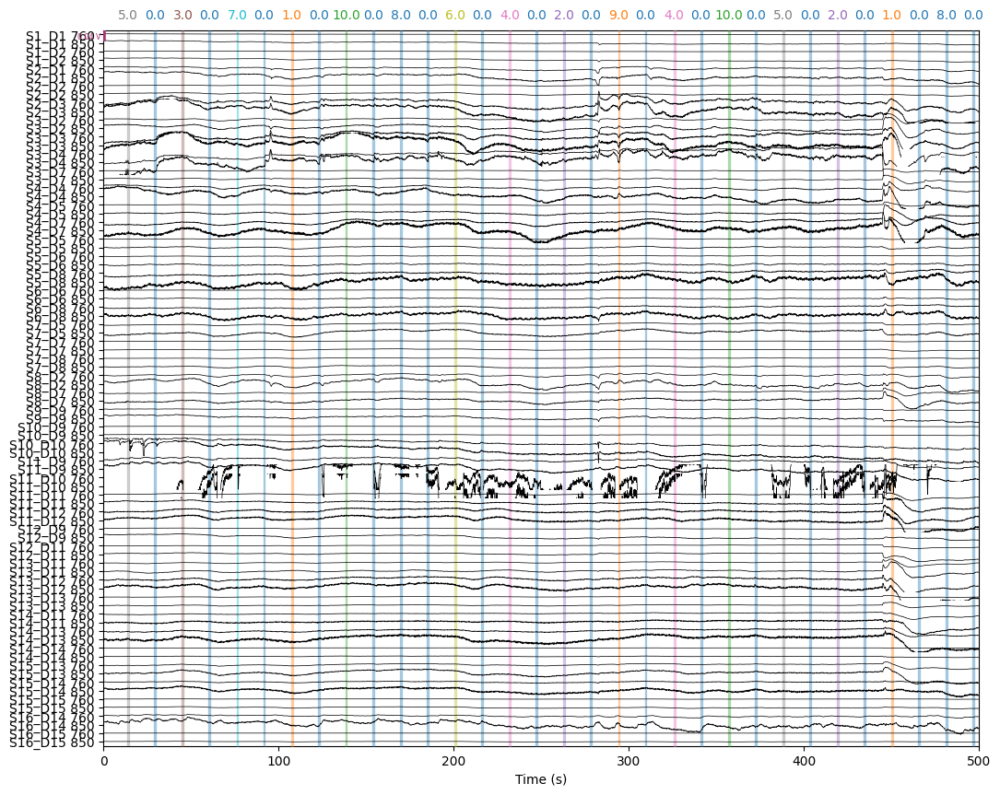

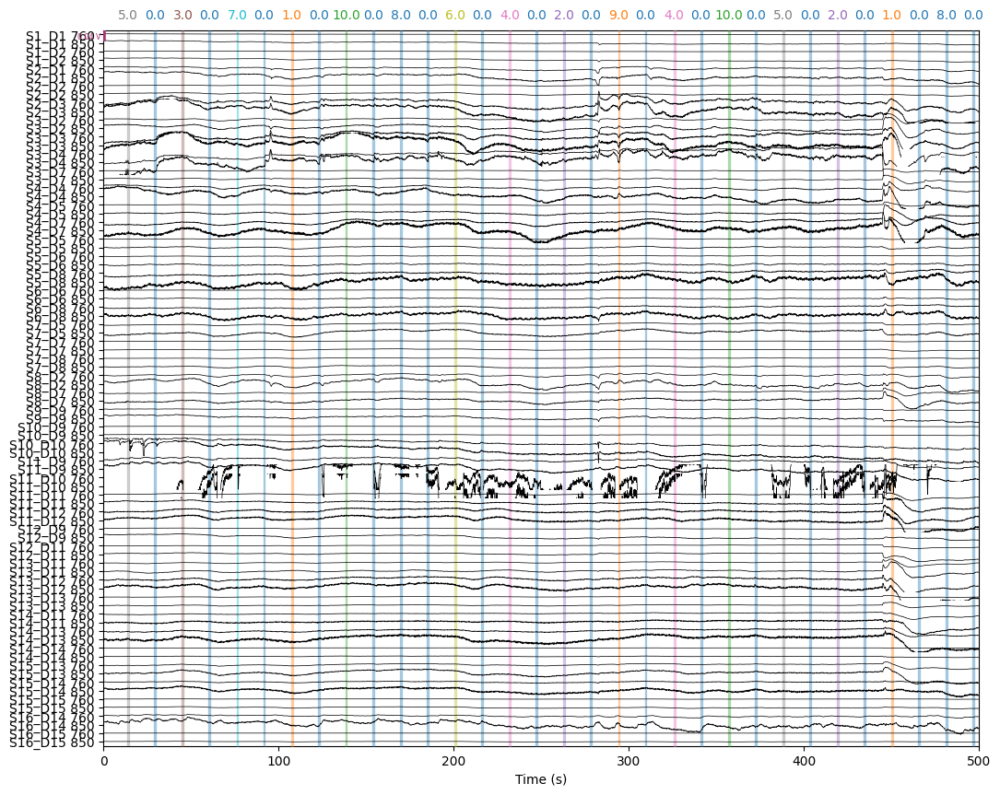

In [34]:
picks = mne.pick_types(raw_intensity.info, meg=False, fnirs=True)
dists = mne.preprocessing.nirs.source_detector_distances(
    raw_intensity.info, picks=picks
)
raw_intensity.pick(picks[dists > 0.01])
raw_intensity.plot(
    n_channels=len(raw_intensity.ch_names), duration=500, show_scrollbars=False
)

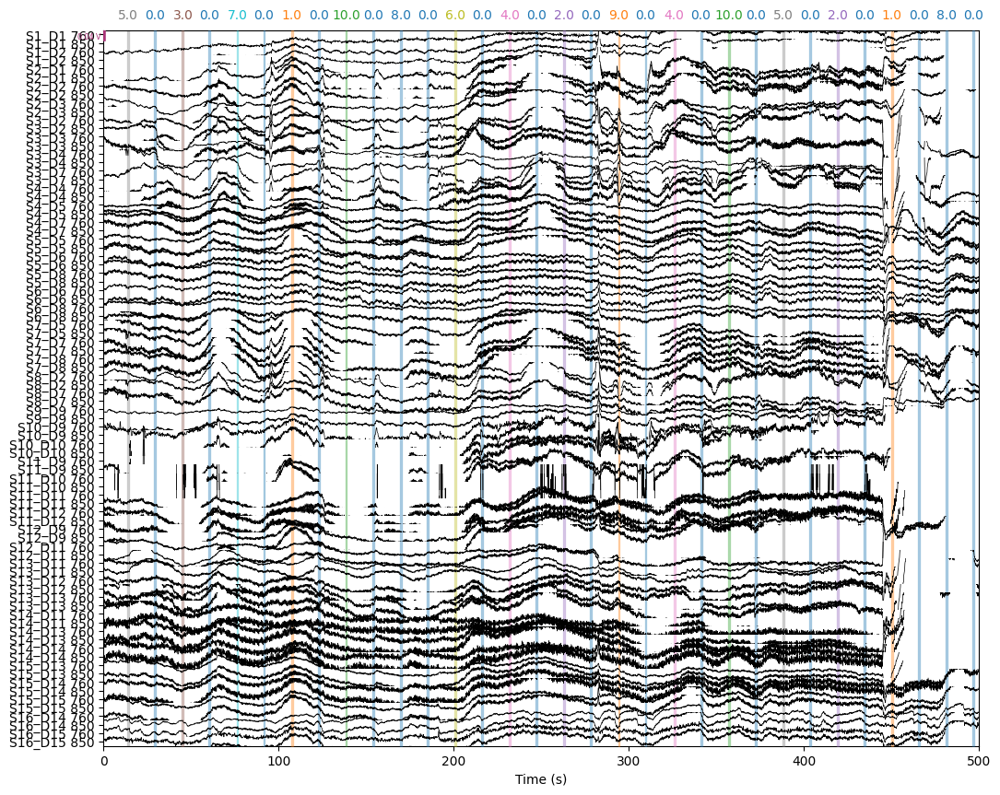

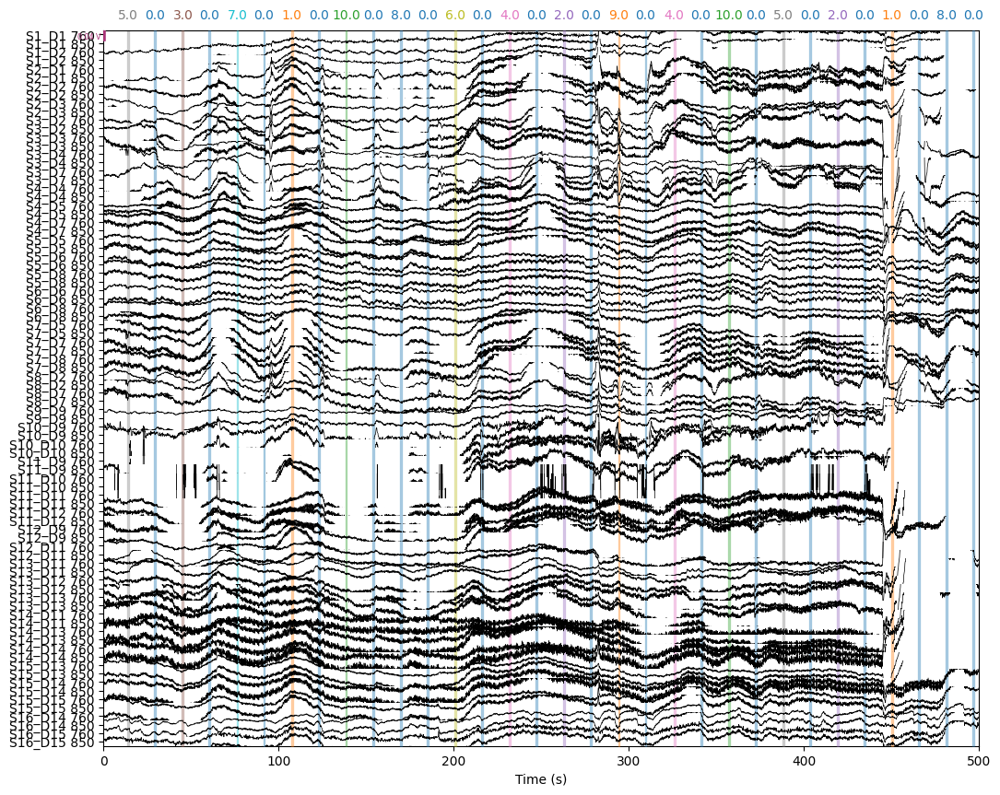

In [35]:
raw_od = mne.preprocessing.nirs.optical_density(raw_intensity)
raw_od.plot(n_channels=len(raw_od.ch_names), duration=500, show_scrollbars=False)

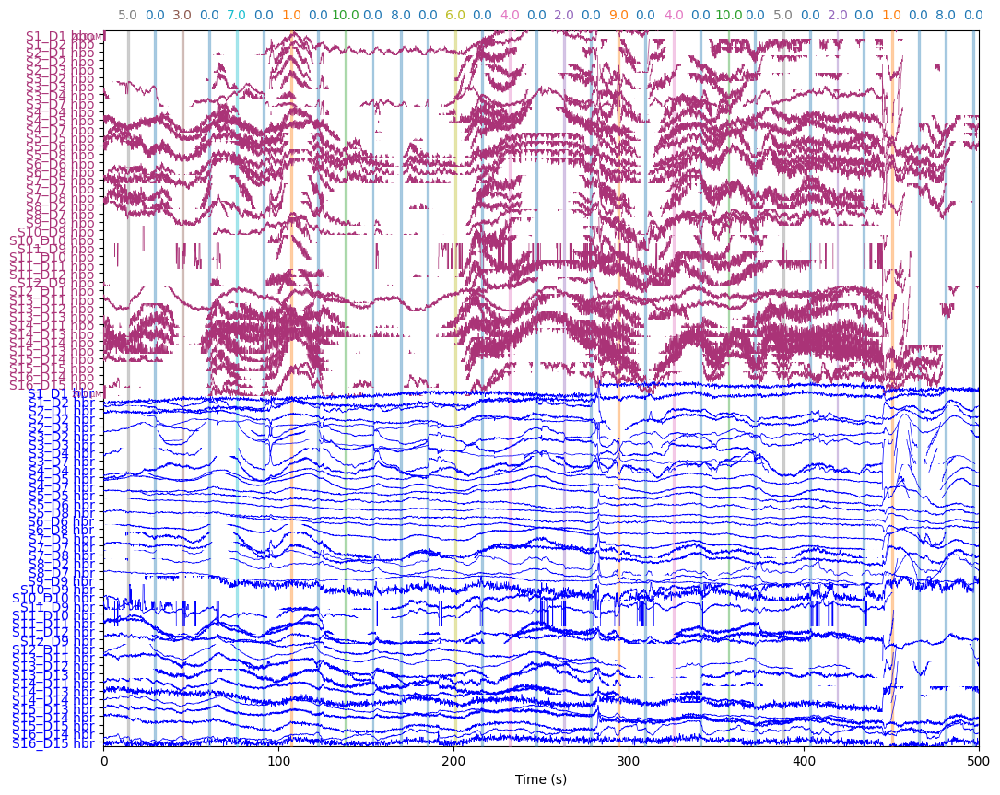

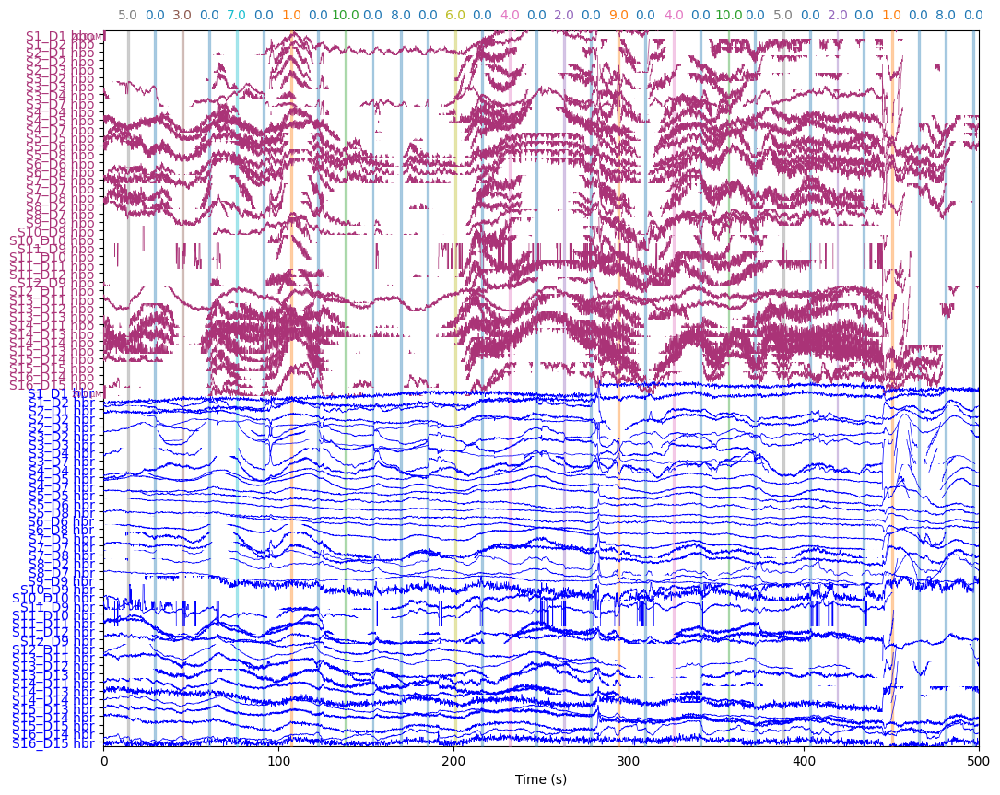

In [36]:
raw_haemo = mne.preprocessing.nirs.beer_lambert_law(raw_od, ppf=0.1)
raw_haemo.plot(n_channels=len(raw_haemo.ch_names), duration=500, show_scrollbars=False)

Used Annotations descriptions: [np.str_('0.0'), np.str_('1.0'), np.str_('10.0'), np.str_('2.0'), np.str_('3.0'), np.str_('4.0'), np.str_('5.0'), np.str_('6.0'), np.str_('7.0'), np.str_('8.0'), np.str_('9.0')]


/var/folders/cp/ch7_5s3518bc53s7b6mvp7540000gp/T/ipykernel_36327/92526870.py:2: RuntimeWarning: More events than default colors available. You should pass a list of unique colors.
  fig = mne.viz.plot_events(events, event_id=event_dict, sfreq=raw_haemo.info["sfreq"])


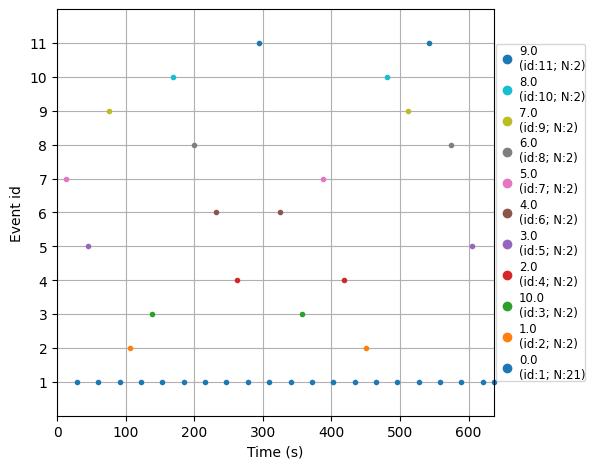

In [37]:
events, event_dict = mne.events_from_annotations(raw_haemo)
fig = mne.viz.plot_events(events, event_id=event_dict, sfreq=raw_haemo.info["sfreq"])

In [61]:
epochs = mne.Epochs(
    raw_haemo,
    events,
    event_id=event_dict,
    tmin=0,
    tmax=15,
    baseline=None,
    verbose=True,
)

Not setting metadata
41 matching events found
No baseline correction applied
0 projection items activated


Using data from preloaded Raw for 21 events and 93 original time points ...
0 bad epochs dropped
Not setting metadata


21 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
21 matching events found
No baseline correction applied
0 projection items activated
combining channels using "mean"
combining channels using "mean"


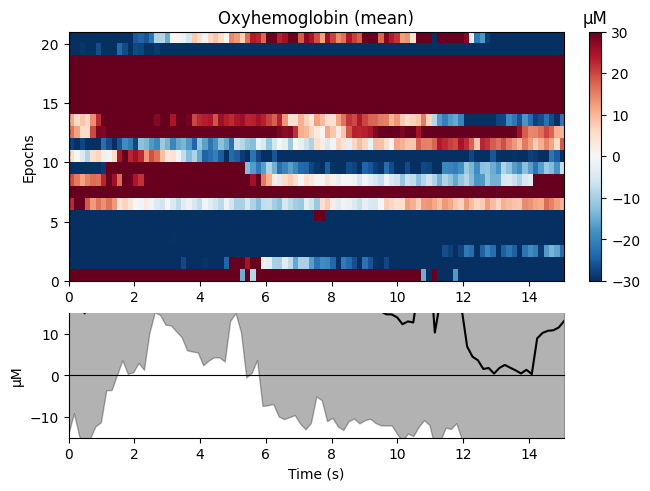

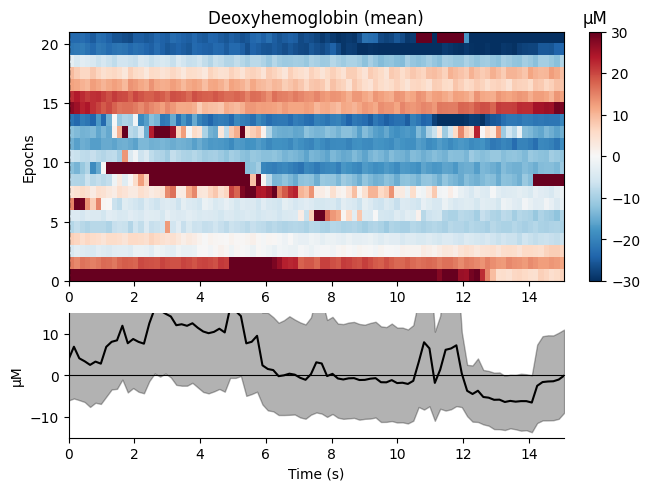

[<Figure size 640x480 with 3 Axes>, <Figure size 640x480 with 3 Axes>]

In [62]:
epochs['0.0'].plot_image(
    combine="mean",
    vmin=-30,
    vmax=30,
    ts_args=dict(ylim=dict(hbo=[-15, 15], hbr=[-15, 15])),
)

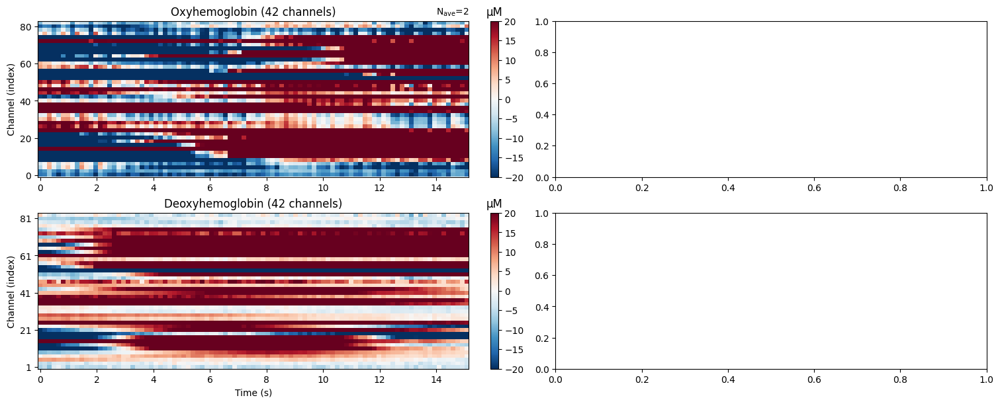

/Users/neha/anaconda3/envs/fnirs/lib/python3.12/site-packages/mne/viz/evoked.py:946: UserWarning: Adding colorbar to a different Figure <Figure size 1500x600 with 7 Axes> than <Figure size 640x480 with 0 Axes> which fig.colorbar is called on.
  cbar = plt.colorbar(im, ax=ax)
/Users/neha/anaconda3/envs/fnirs/lib/python3.12/site-packages/mne/viz/evoked.py:946: UserWarning: Adding colorbar to a different Figure <Figure size 1500x600 with 8 Axes> than <Figure size 640x480 with 0 Axes> which fig.colorbar is called on.
  cbar = plt.colorbar(im, ax=ax)


<Figure size 640x480 with 0 Axes>

In [68]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15, 6), layout="constrained")
clims = dict(hbo=[-20, 20], hbr=[-20, 20])
epochs['1.0'].average().plot_image(axes=axes[:, 0], clim=clims)
epochs['2.0'].average().plot_image(axes=axes[:, 1], clim=clims)
for column, condition in enumerate(['1.0', '2.0']):
    for ax in axes[column, :]:
        ax.set_title(f"{condition}: {ax.get_title()}")

Using data from preloaded Raw for 2 events and 93 original time points ...


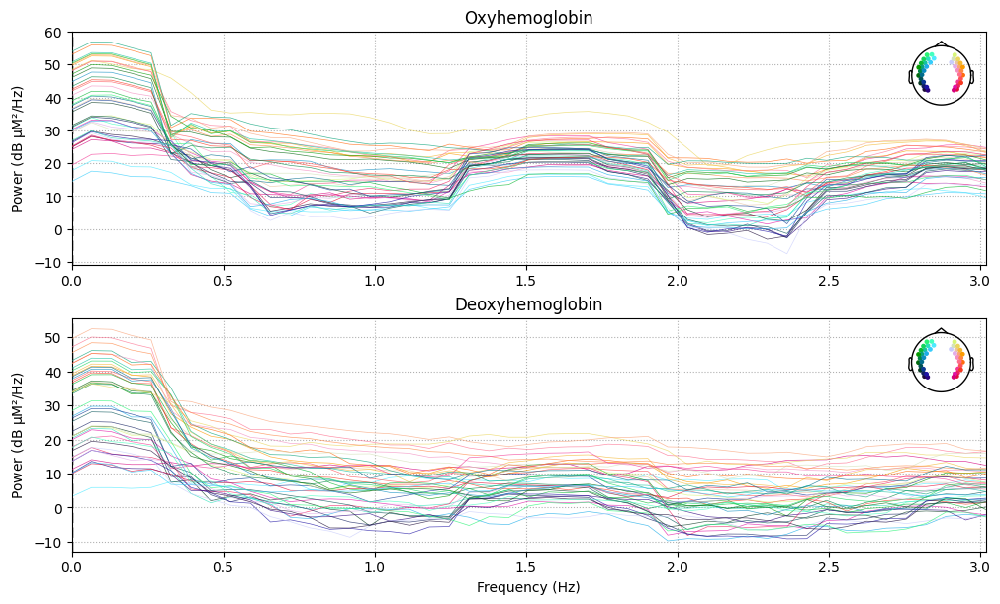

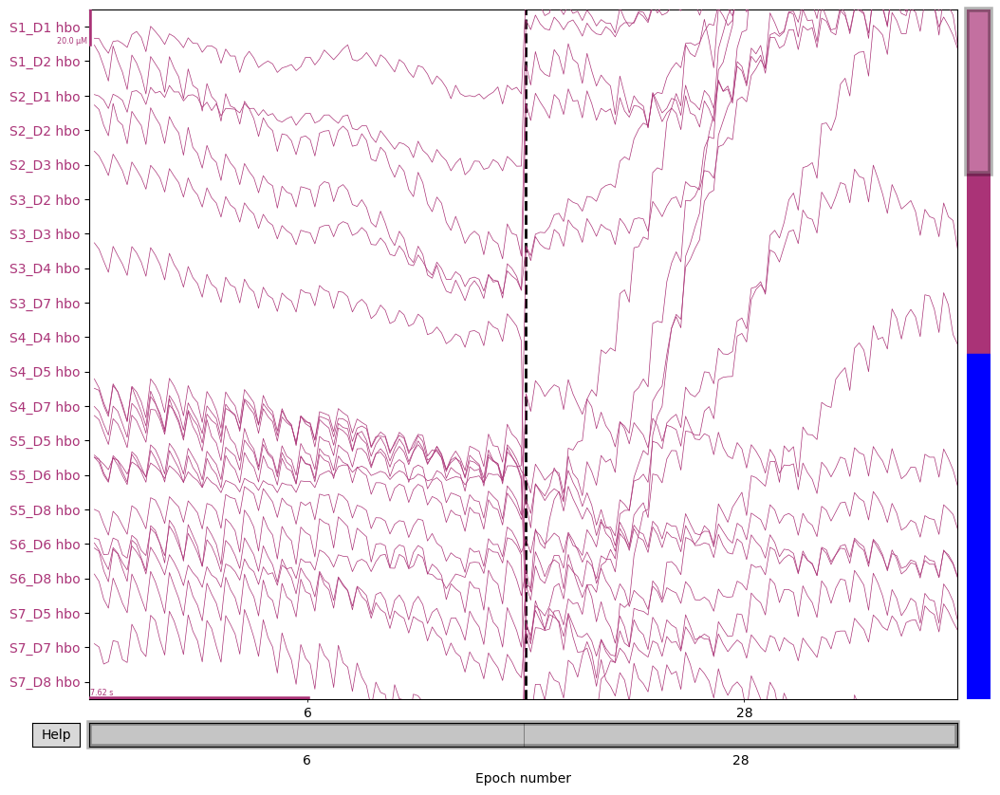

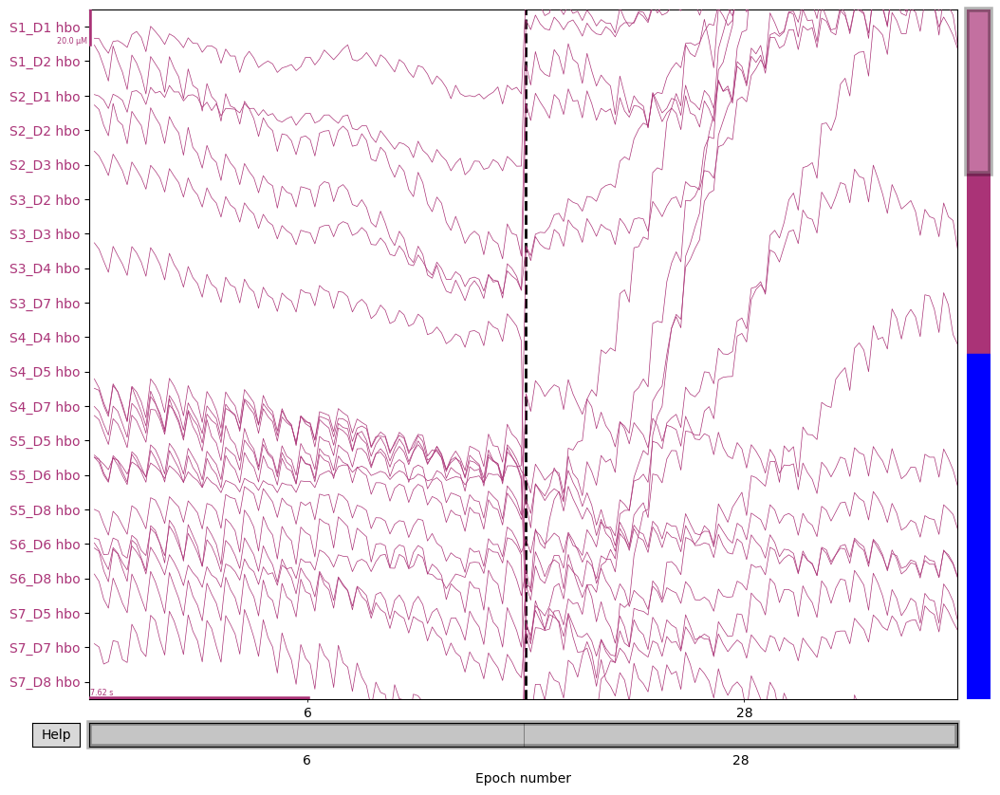

In [70]:
epochs['1.0'].plot()

In [64]:
times = np.arange(-0.1, 0.25, 0.4)
topomap_args = dict(extrapolate="local")
epochs['1.0'].average(picks="hbo").plot_joint(
    times=times, topomap_args=topomap_args
)

No projector specified for this dataset. Please consider the method self.add_proj.


ValueError: Times should be between 0.0 and 15.1.

Using data from preloaded Raw for 20 events and 93 original time points ...


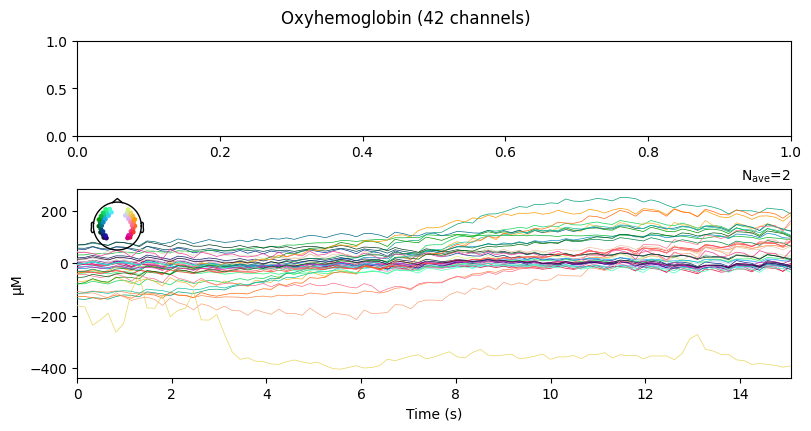

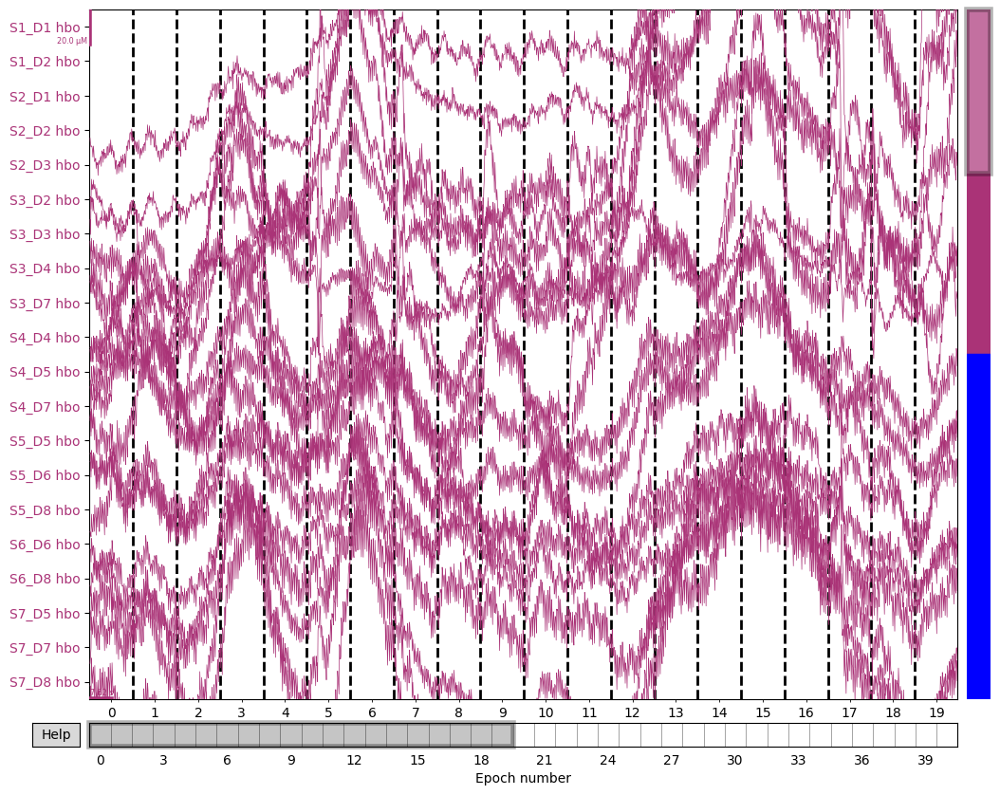

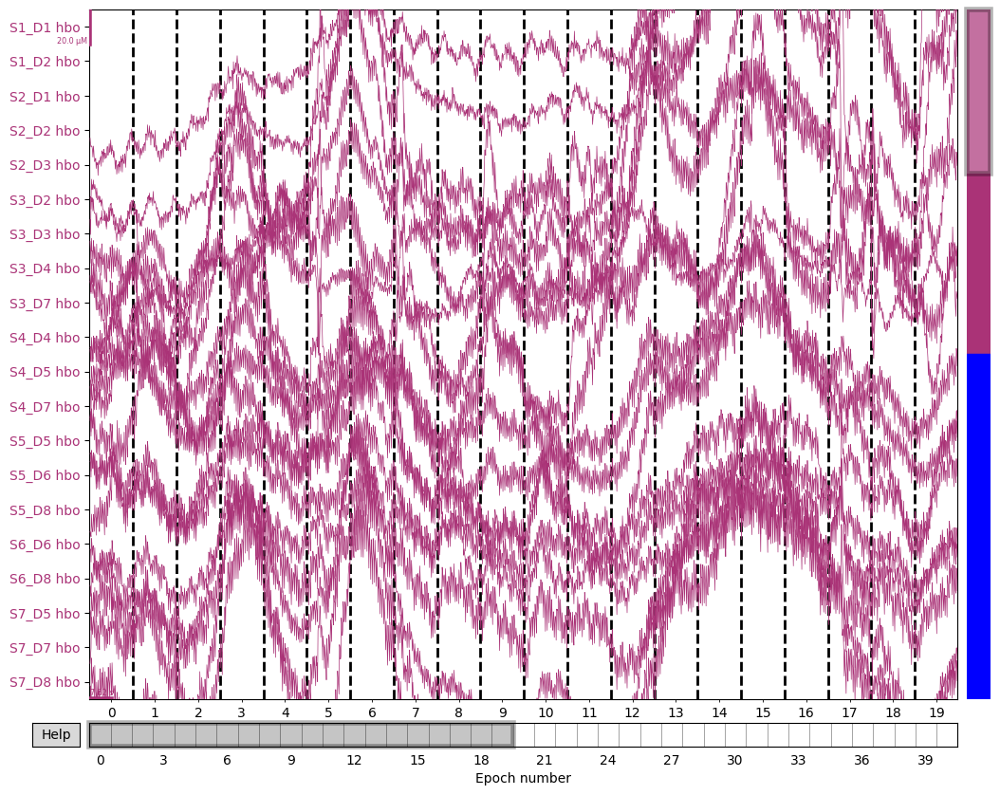

In [67]:
epochs.plot()

In [65]:
epochs.get_data().shape

Using data from preloaded Raw for 41 events and 93 original time points ...
0 bad epochs dropped


(41, 84, 93)

In [66]:
epochs.events.shape

(41, 3)

In [104]:
# load all unprocessed data for all experiments
import os
all_experiments = os.listdir(SUBJECT_NAME)
all_data = []
all_labels = []
for experiment in all_experiments:
    data_path = os.path.join(SUBJECT_NAME, experiment, f"{experiment}UnProcessedData.npy")
    labels_path = os.path.join(SUBJECT_NAME, experiment, f"{experiment}UnProcessedLabels.npy")
    data = np.load(data_path)
    labels = np.load(labels_path, allow_pickle=True)
    assert data.shape[0] == labels.shape[0], f"Data and labels have different lengths for {experiment}, {data.shape[0]} != {labels.shape[0]}"
    
    if len(data) % 2 != 0:
        print(
            f"Experiment {experiment} has an odd number of samples ({len(data)}). Dropping the last sample.")
        data = data[:-1]
        labels = labels[:-1]
    data = data.reshape(-1, 2, 84,
                                93).swapaxes(1, 2).reshape(-1, 84, 93 * 2)
    labels = labels[0::2]#[:-1]
    # print(labels)
    if not np.all(labels[:, 2] != '0.0'):
        print(
            f"There are still rest labels in the data, check {experiment}")

    assert data.shape[0] == labels.shape[
        0], f"Data and labels have different lengths: {data.shape[0]} and {labels.shape[0]}"

    all_data.append(data)
    all_labels.append(labels)

all_labels = [l[:, 2].astype('float').astype(
                'int') - 2 for l in all_labels]
all_data = np.concatenate(all_data)
all_labels = np.concatenate(all_labels)

print(np.unique(all_labels))
all_data.shape, all_labels.shape

Experiment 2024-06-19_001 has an odd number of samples (41). Dropping the last sample.
Experiment 2024-06-20_005 has an odd number of samples (41). Dropping the last sample.
[0 1 2 3 4 5 6 7 8 9]


((320, 84, 186), (320,))

/var/folders/cp/ch7_5s3518bc53s7b6mvp7540000gp/T/ipykernel_36327/1180880522.py:31: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(all_data_pca[all_data_kmeans == i, 0], all_data_pca[all_data_kmeans == i, 1], all_data_pca[all_data_kmeans == i, 2], c=colors[i], label=f'Cluster {i}')


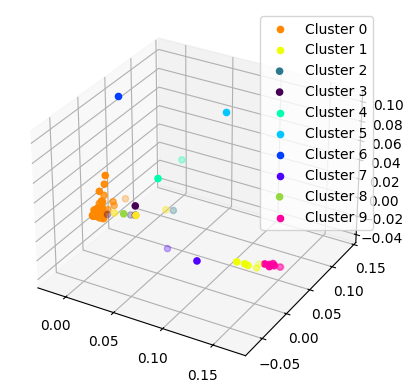

/var/folders/cp/ch7_5s3518bc53s7b6mvp7540000gp/T/ipykernel_36327/1180880522.py:40: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(all_data_pca[all_labels == i, 0], all_data_pca[all_labels == i, 1], all_data_pca[all_labels == i, 2], c=colors[i], label=f'Label {i}')


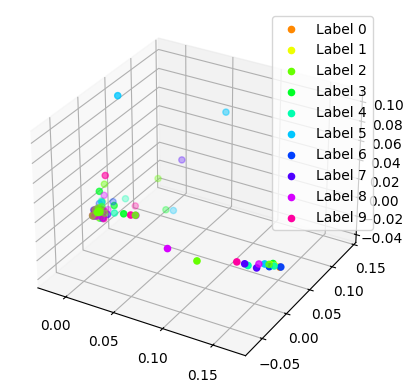

In [113]:
# apply PCA to reduce the number of features
# apply k-means clustering
# display the results of the clustering along with the true labels to see how well the clustering worked
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import confusion_matrix
import seaborn as sns

# all_data = (n_samples, n_channels, n_timepoints)
# reshape to (n_samples, n_channels * n_timepoints)
all_data_reshaped = all_data.reshape(all_data.shape[0], -1)
all_data_reshaped.shape

# apply PCA
pca = PCA(n_components=3)
all_data_pca = pca.fit_transform(all_data_reshaped)
all_data_pca.shape

# apply k-means clustering
kmeans = KMeans(n_clusters=10)
all_data_kmeans = kmeans.fit_predict(all_data_pca)

# show PCA results in 3D
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
colors = sns.color_palette('hsv', 10)
for i in range(10):
    ax.scatter(all_data_pca[all_data_kmeans == i, 0], all_data_pca[all_data_kmeans == i, 1], all_data_pca[all_data_kmeans == i, 2], c=colors[i], label=f'Cluster {i}')
plt.legend()
plt.show()

# show the same data with the true labels
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
colors = sns.color_palette('hsv', 10)
for i in range(10):
    ax.scatter(all_data_pca[all_labels == i, 0], all_data_pca[all_labels == i, 1], all_data_pca[all_labels == i, 2], c=colors[i], label=f'Label {i}')
    
plt.legend()
plt.show()

/var/folders/cp/ch7_5s3518bc53s7b6mvp7540000gp/T/ipykernel_36327/1480804911.py:27: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(all_data_pca[all_data_kmeans == i, 0], all_data_pca[all_data_kmeans == i, 1], all_data_pca[all_data_kmeans == i, 2], c=colors[i], label=f'Cluster {i}')


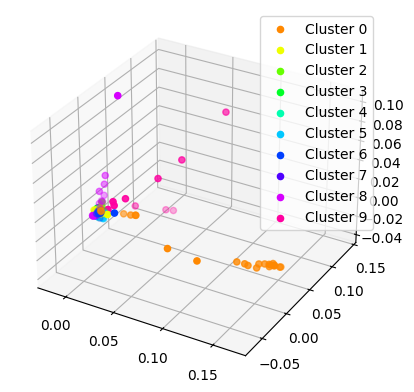

/var/folders/cp/ch7_5s3518bc53s7b6mvp7540000gp/T/ipykernel_36327/1480804911.py:36: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(all_data_pca[all_labels == i, 0], all_data_pca[all_labels == i, 1], all_data_pca[all_labels == i, 2], c=colors[i], label=f'Cluster {i}')


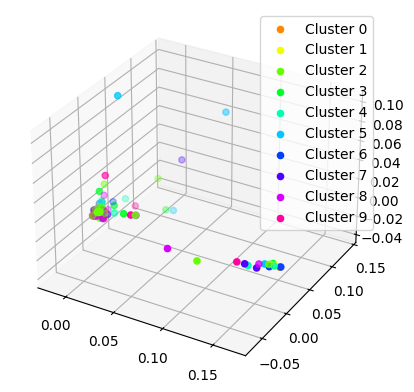

In [112]:
# apply t-SNE to reduce the number of features
# apply k-means clustering
# display the results of the clustering along with the true labels to see how well the clustering worked
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.metrics import confusion_matrix
import seaborn as sns


all_data_reshaped = all_data.reshape(all_data.shape[0], -1)
all_data_reshaped.shape

tsne = TSNE(n_components=3)
all_data_tsne = tsne.fit_transform(all_data_reshaped)

kmeans = KMeans(n_clusters=10)
all_data_kmeans = kmeans.fit_predict(all_data_tsne)

# show PCA results in 3D
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
colors = sns.color_palette('hsv', 10)
for i in range(10):
    ax.scatter(all_data_pca[all_data_kmeans == i, 0], all_data_pca[all_data_kmeans == i, 1], all_data_pca[all_data_kmeans == i, 2], c=colors[i], label=f'Cluster {i}')
plt.legend()
plt.show()

# show the same plot but with the true labels
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
colors = sns.color_palette('hsv', 10)
for i in range(10):
    ax.scatter(all_data_pca[all_labels == i, 0], all_data_pca[all_labels == i, 1], all_data_pca[all_labels == i, 2], c=colors[i], label=f'Cluster {i}')
plt.legend()
plt.show()